<h2>OBSERVATIONAL ASTROPHYSICS – FALL 2019 Reduction Exercise: Part 3</h2>

In this part you will take all of your images in a given band and align them using a program called "astroalign"

We will be aligning images with the http://toros-astro.github.io/astroalign/ package

First, from within your python3 enviroment you will need to run "*conda install astroalign*" to install the package

In [2]:
import astroalign as aa
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib inline
from astropy.io import fits

A function that takes an source image name, a target image name to which the source will be transformed, and an output file name.  The output file will be the source image transformed to match the target image.

In [3]:

def im_trans(filesource,filetarg,fileout):
    #filesource is the file that you want to be transformed
    #filetarg is the file that you want to transform the first file to
    #fileout is the output file that has been transformed

    redpath = "/home/c055g248/ASTR596/Data/Reduced/20191105/"
    imgfilesource = redpath + filesource
    imgfiletarg = redpath + filetarg
    print(imgfilesource)

    #read in the source file and target file, splitting the file into a data and header component
    imgsource, hdrsource = fits.getdata(imgfilesource, header=True)
    imgtarg, hdrtarg = fits.getdata(imgfiletarg, header=True)

    #run the alignment tool.
    imgsource_aligned, footprint = aa.register(imgsource, imgtarg)

    #write out the transformed file
    imtransname = redpath + fileout
    fits.writeto(imtransname, imgsource_aligned, header=hdrsource, overwrite=True)

    #find the transformation
    p, (pos_imgsource, pos_imgsource_aligned) = aa.find_transform(imgsource, imgtarg)
                            
    #print out the transformation
    #******check that the output makes sense for each target
    print("Rotation: {:.2f} degrees".format(p.rotation * 180.0 / np.pi))
    print("\nScale factor: {:.2f}".format(p.scale))
    print("\nTranslation: (x, y) = ({:.2f}, {:.2f})".format(*p.translation))
    
    #plot the stars found in common in each plot
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    colors = ['r', 'g', 'b', 'y', 'cyan', 'w', 'm']

    axes[0, 0].imshow(imgsource, cmap='gray', interpolation='none', origin='lower',vmin = 250, vmax = 1000)
    axes[0, 0].axis('off')
    axes[0, 0].set_title("Source Image")
    for (xp, yp), c in zip(pos_imgsource[:len(colors)], colors):
        circ = plt.Circle((xp, yp), 4, fill=False, edgecolor=c, linewidth=5)
        axes[0, 0].add_patch(circ)

    axes[0, 1].imshow(imgtarg, cmap='gray', interpolation='none', origin='lower',vmin = 250, vmax = 1000)
    axes[0, 1].axis('off')
    axes[0, 1].set_title("Target Image")
    for (xp, yp), c in zip(pos_imgsource_aligned[:len(colors)], colors):
        circ = plt.Circle((xp, yp), 4 * p.scale, fill=False, edgecolor=c, linewidth=5)
        axes[0, 1].add_patch(circ)

    axes[1, 1].imshow(imgsource_aligned, cmap='gray', interpolation='none', origin='lower',vmin = 250, vmax = 1000)
    axes[1, 1].axis('off')
    axes[1, 1].set_title("Source Image aligned with Target")
    for (xp, yp), c in zip(pos_imgsource_aligned[:len(colors)], colors):
        circ = plt.Circle((xp, yp), 4 * p.scale, fill=False, edgecolor=c, linewidth=5)
        axes[1, 1].add_patch(circ)

    axes[1, 0].axis('off')

    plt.tight_layout()
    plt.show()

Make a series of calls to this function that transform each of your images to the first image in that band for each target.  I give an example below.

/home/c055g248/ASTR596/Data/Reduced/20191105/s046_trbf.fits
Rotation: 0.00 degrees

Scale factor: 1.00

Translation: (x, y) = (-36.35, 2.34)


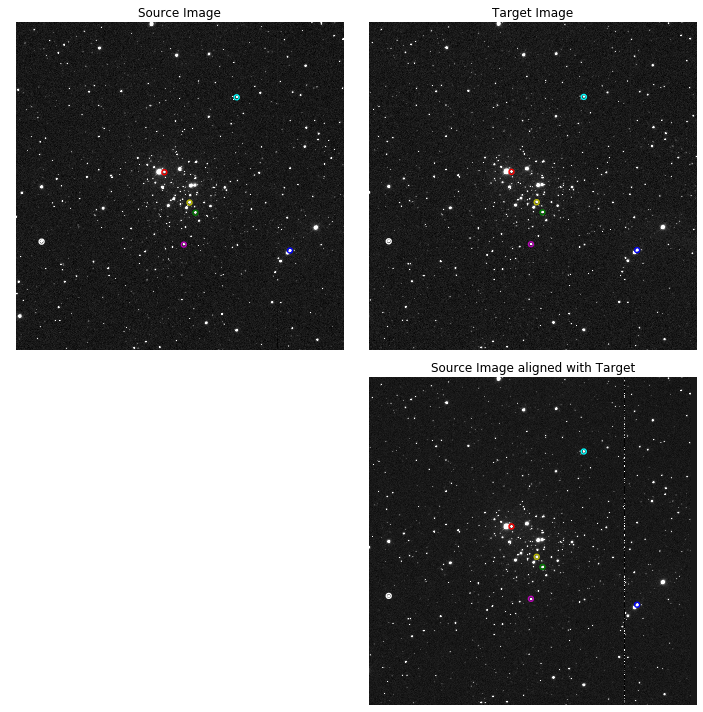

/home/c055g248/ASTR596/Data/Reduced/20191105/s047_trbf.fits
Rotation: 0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (-73.32, 3.81)


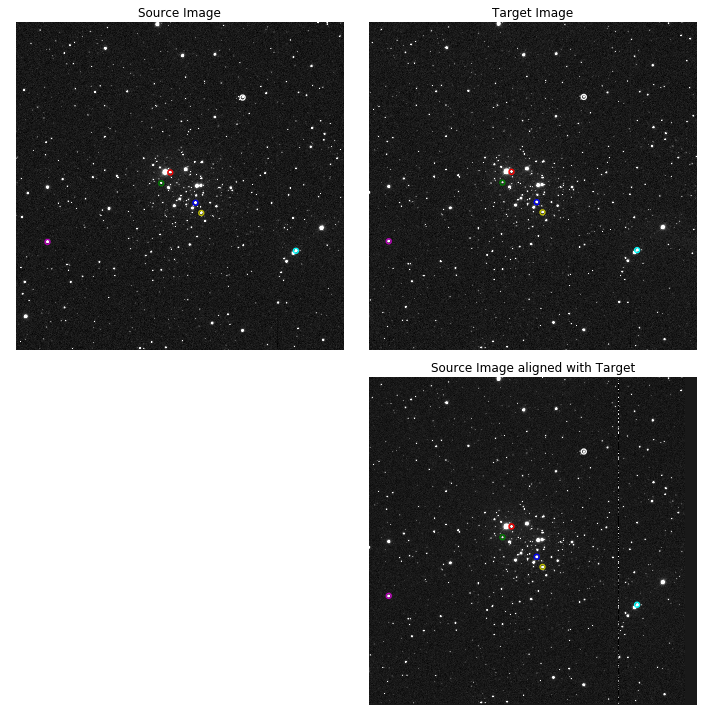

/home/c055g248/ASTR596/Data/Reduced/20191105/s048_trbf.fits
Rotation: 0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (-104.33, 5.28)


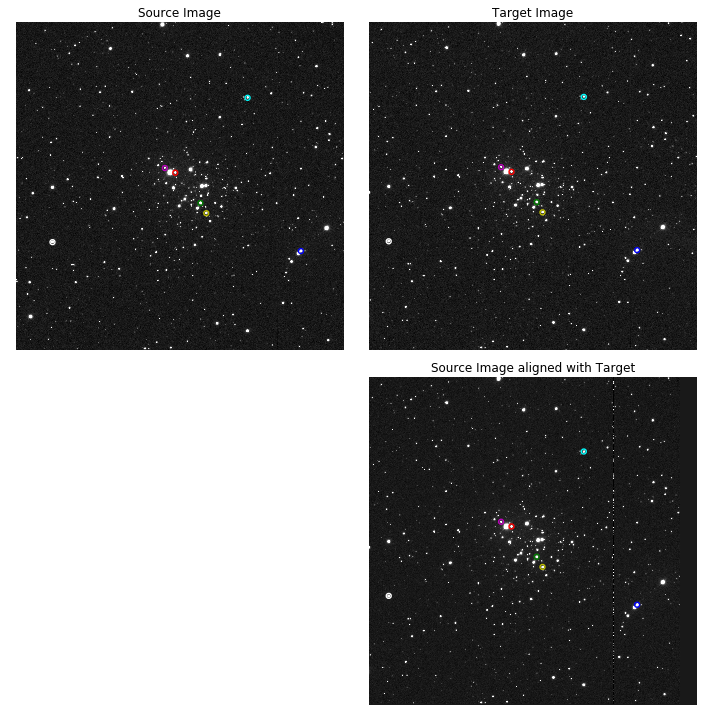

/home/c055g248/ASTR596/Data/Reduced/20191105/s049_trbf.fits
Rotation: 0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (-135.67, 6.20)


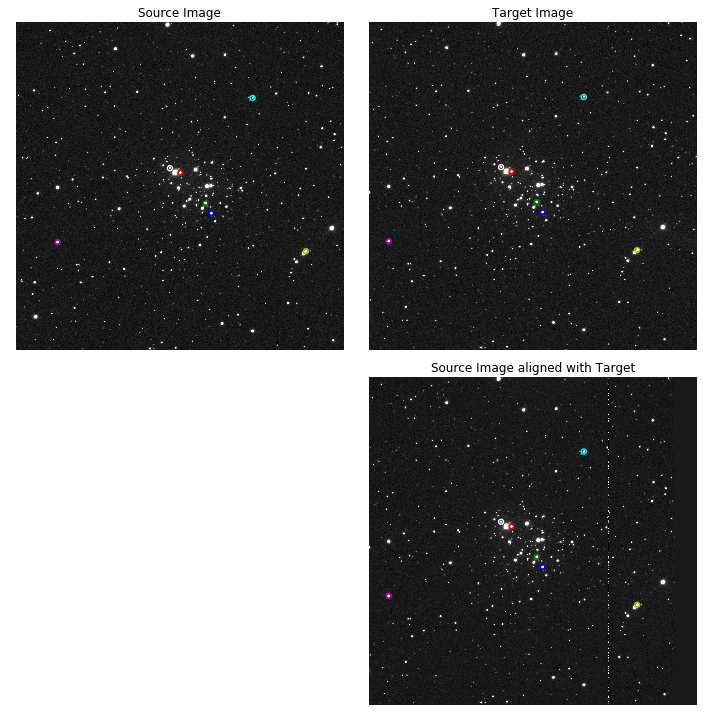

/home/c055g248/ASTR596/Data/Reduced/20191105/s050_trbf.fits
Rotation: 0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (-167.19, 7.47)


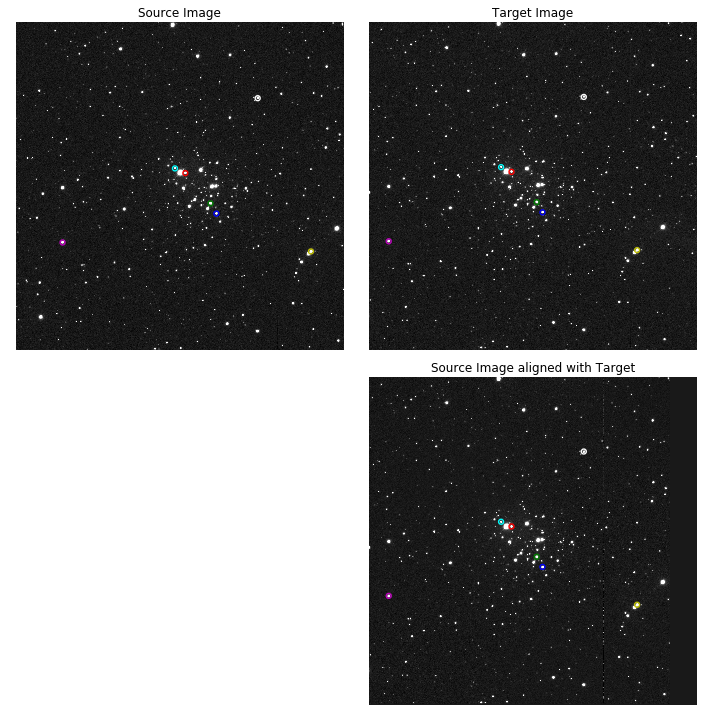

/home/c055g248/ASTR596/Data/Reduced/20191105/s051_trbf.fits
Rotation: 0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (-198.04, 8.68)


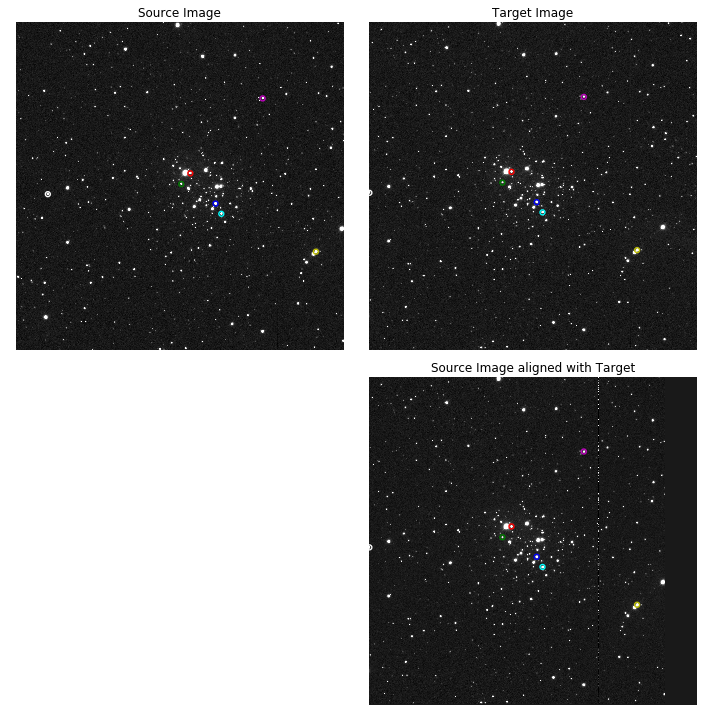

/home/c055g248/ASTR596/Data/Reduced/20191105/s052_trbf.fits
Rotation: 0.03 degrees

Scale factor: 1.00

Translation: (x, y) = (-226.87, 9.71)


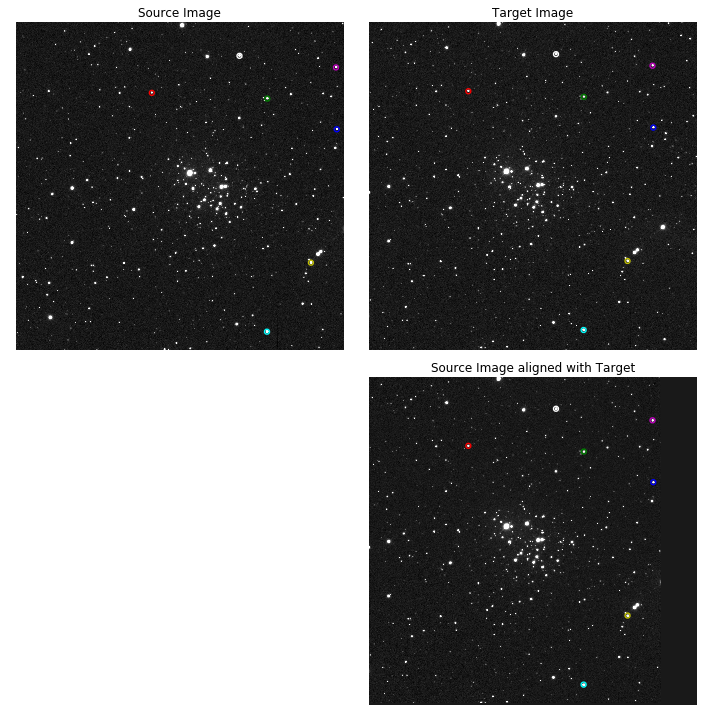

/home/c055g248/ASTR596/Data/Reduced/20191105/s061_trbf.fits
Rotation: -0.00 degrees

Scale factor: 1.00

Translation: (x, y) = (-50.28, 16.55)


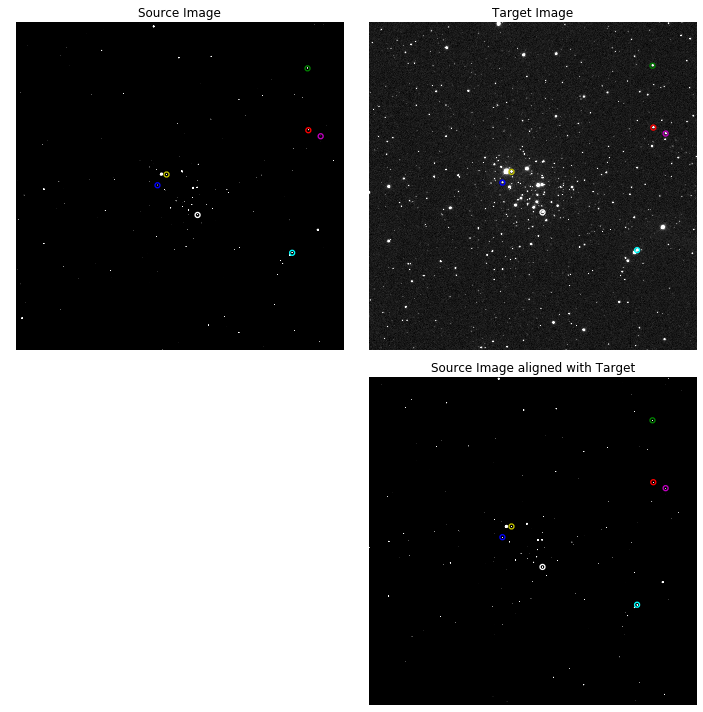

/home/c055g248/ASTR596/Data/Reduced/20191105/s062_trbf.fits
Rotation: 0.00 degrees

Scale factor: 1.00

Translation: (x, y) = (-81.35, 16.32)


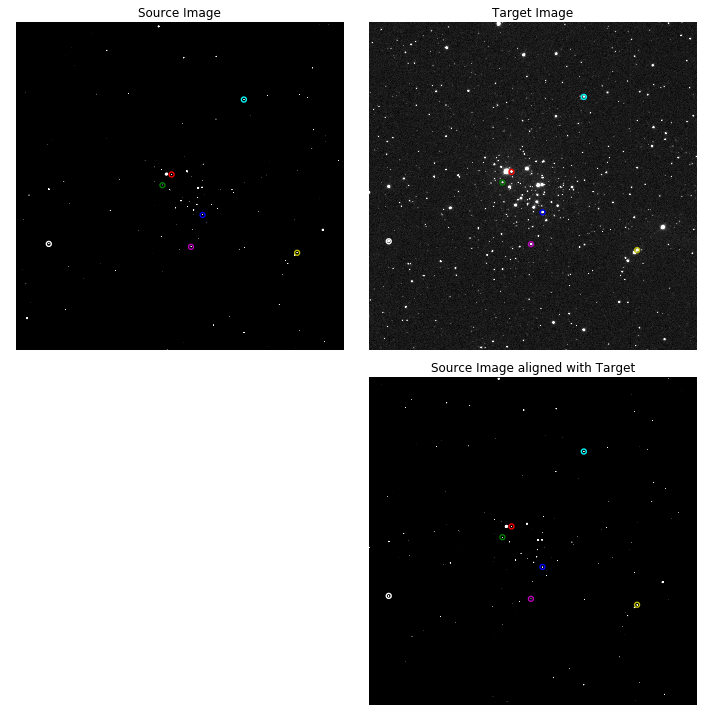

/home/c055g248/ASTR596/Data/Reduced/20191105/s063_trbf.fits
Rotation: 0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (-112.75, 16.26)


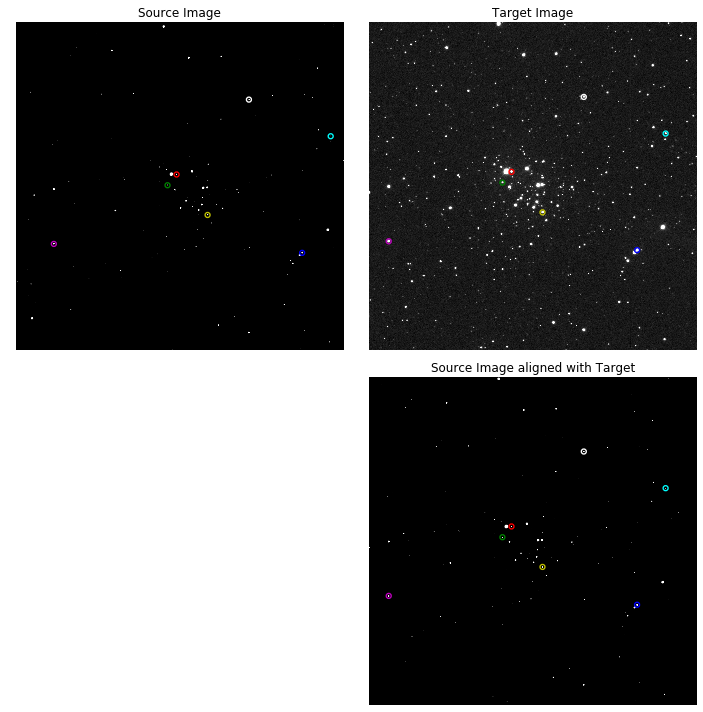

/home/c055g248/ASTR596/Data/Reduced/20191105/s054_trbf.fits
Rotation: -0.00 degrees

Scale factor: 1.00

Translation: (x, y) = (29.45, 0.95)


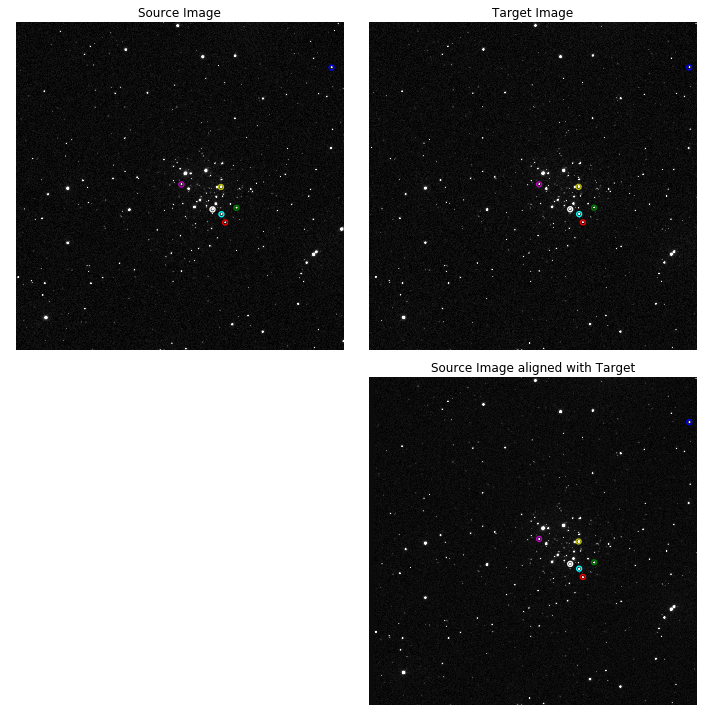

/home/c055g248/ASTR596/Data/Reduced/20191105/s055_trbf.fits
Rotation: -0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (60.72, 2.29)


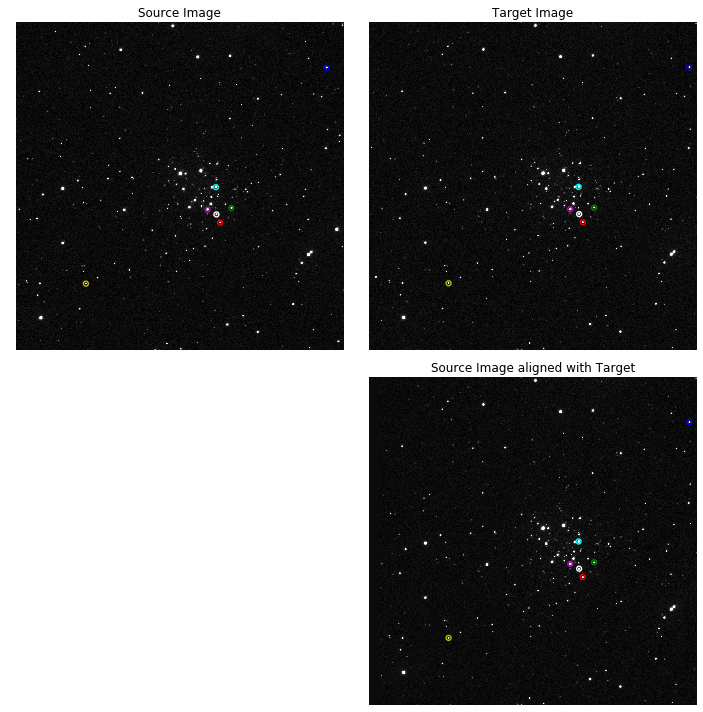

/home/c055g248/ASTR596/Data/Reduced/20191105/s056_trbf.fits
Rotation: -0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (89.08, 3.14)


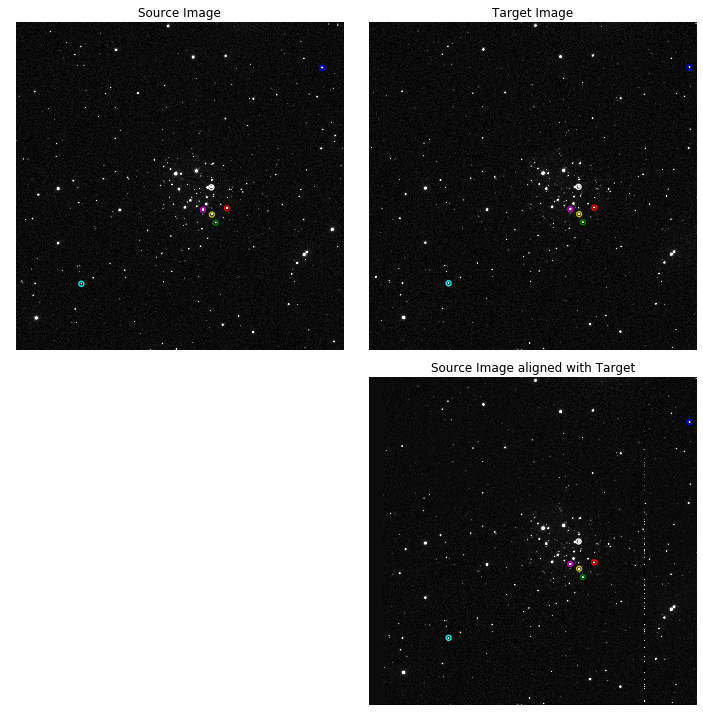

/home/c055g248/ASTR596/Data/Reduced/20191105/s057_trbf.fits
Rotation: -0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (120.19, 4.35)


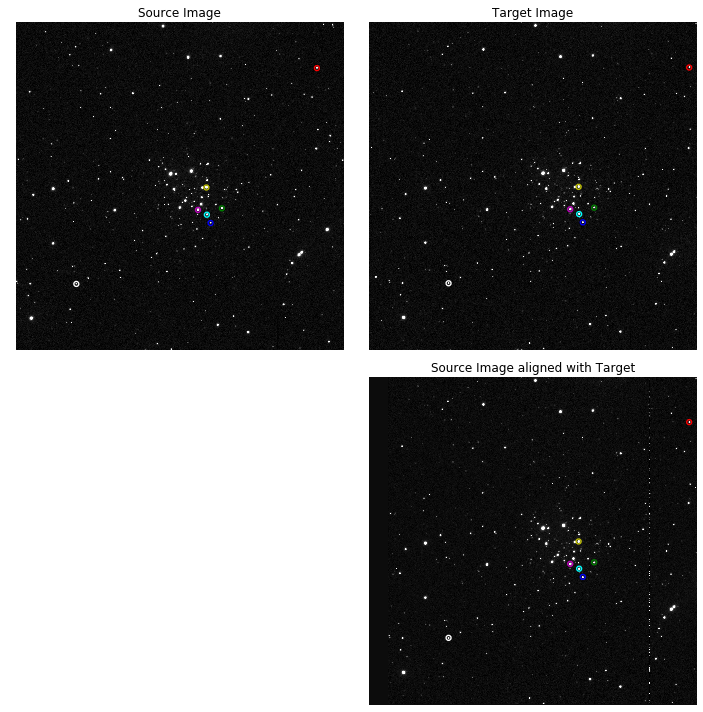

/home/c055g248/ASTR596/Data/Reduced/20191105/s058_trbf.fits
Rotation: -0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (150.83, 5.21)


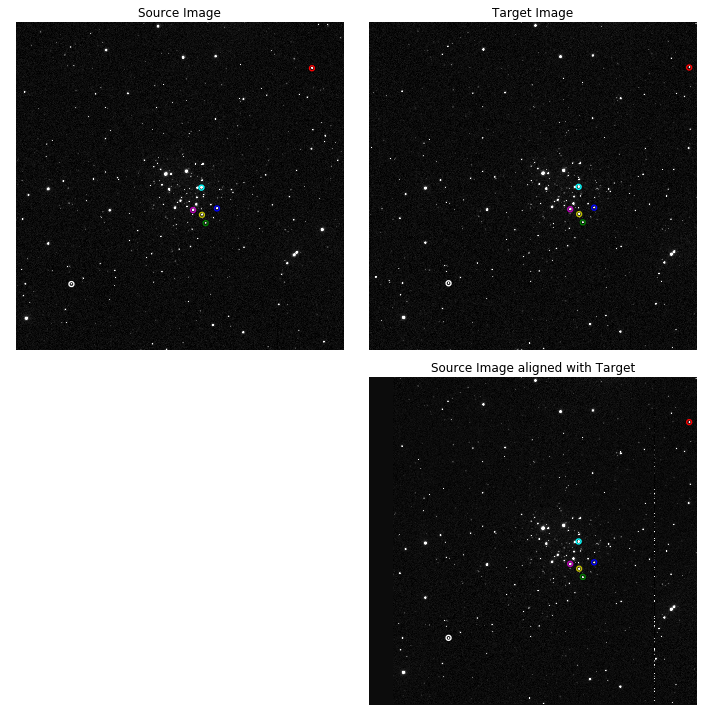

/home/c055g248/ASTR596/Data/Reduced/20191105/s059_trbf.fits
Rotation: -0.03 degrees

Scale factor: 1.00

Translation: (x, y) = (178.82, 6.07)


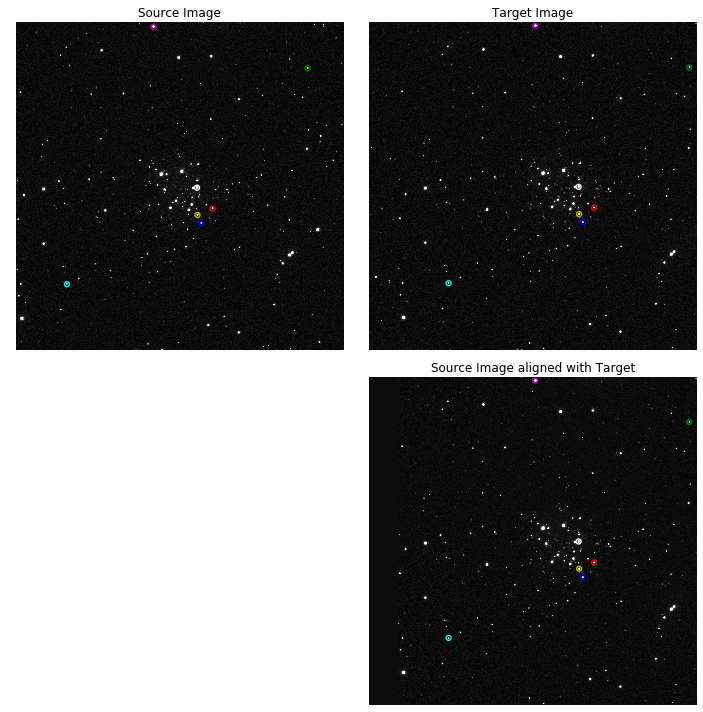

/home/c055g248/ASTR596/Data/Reduced/20191105/s060_trbf.fits
Rotation: -0.03 degrees

Scale factor: 1.00

Translation: (x, y) = (209.50, 5.77)


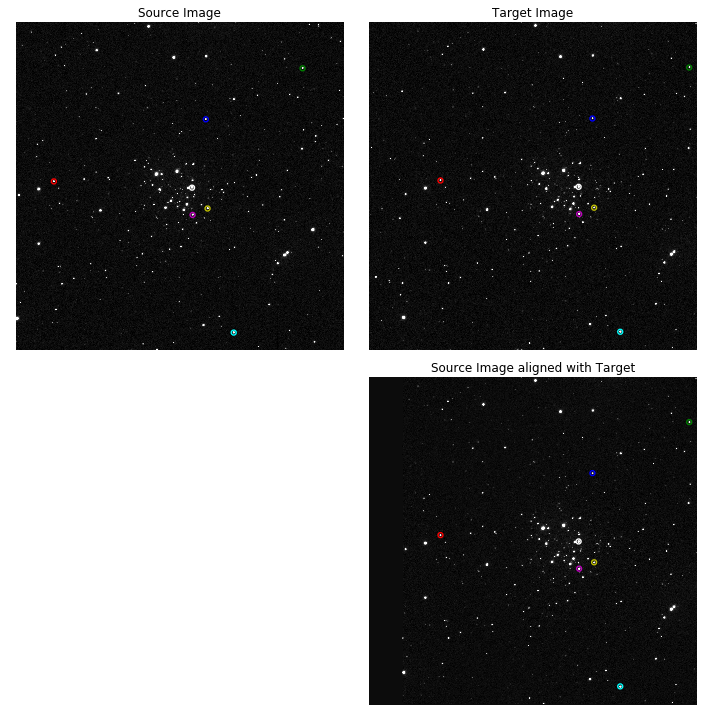

/home/c055g248/ASTR596/Data/Reduced/20191105/s064_trbf.fits
Rotation: -0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (144.02, 6.08)


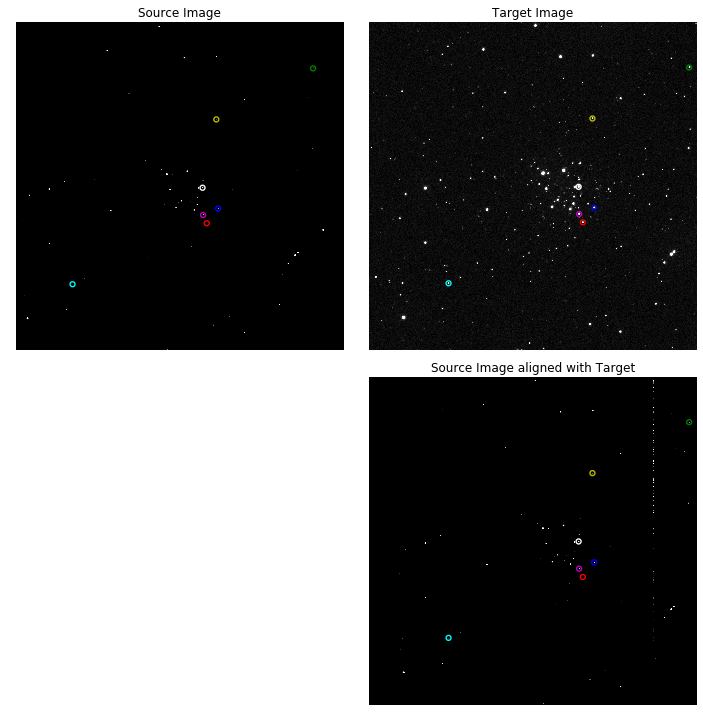

/home/c055g248/ASTR596/Data/Reduced/20191105/s065_trbf.fits
Rotation: -0.03 degrees

Scale factor: 1.00

Translation: (x, y) = (175.97, 5.49)


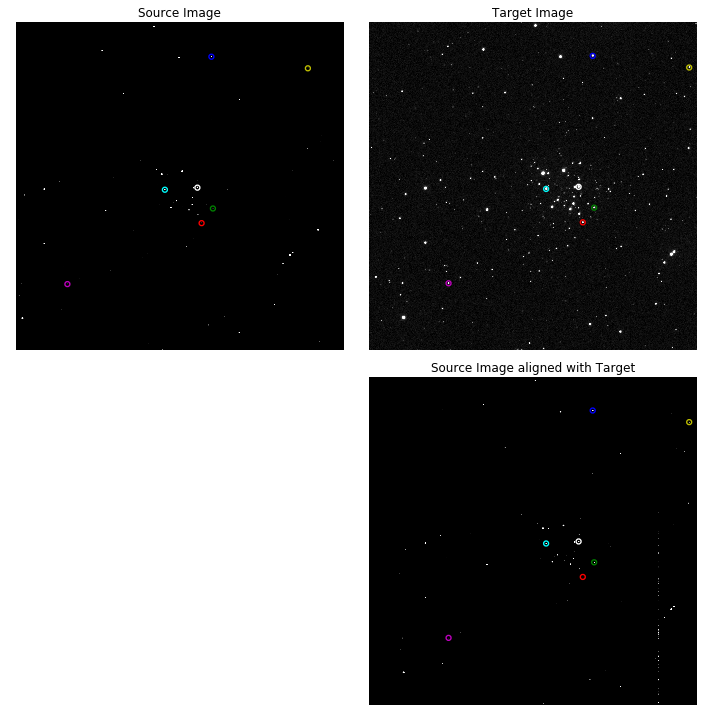

/home/c055g248/ASTR596/Data/Reduced/20191105/s066_trbf.fits
Rotation: -0.03 degrees

Scale factor: 1.00

Translation: (x, y) = (206.44, 5.97)


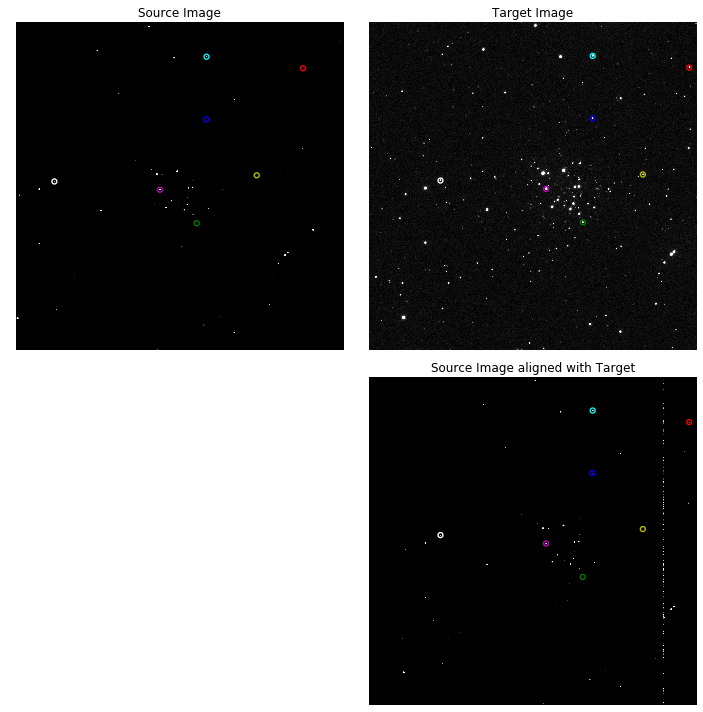

/home/c055g248/ASTR596/Data/Reduced/20191105/s086_trbf.fits
Rotation: -0.00 degrees

Scale factor: 1.00

Translation: (x, y) = (26.46, 0.92)


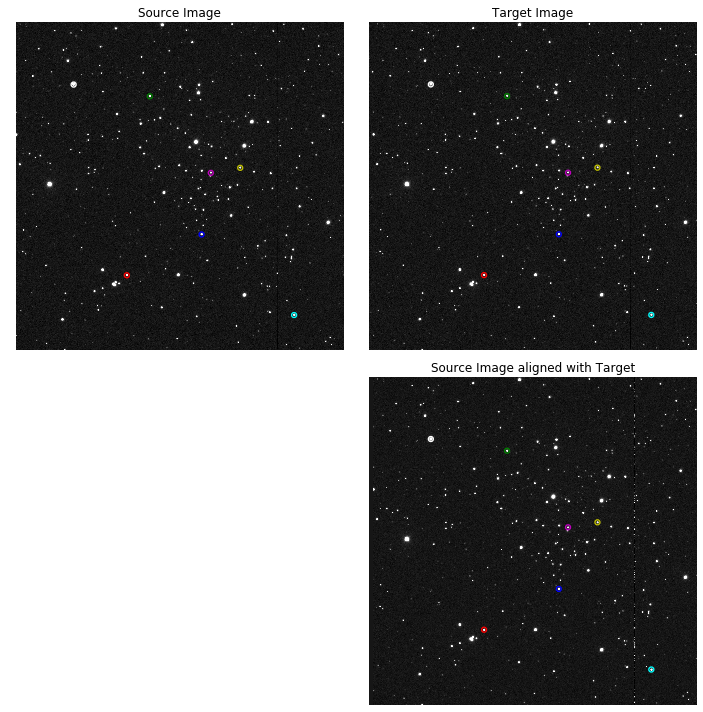

/home/c055g248/ASTR596/Data/Reduced/20191105/s087_trbf.fits
Rotation: -0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (51.79, 1.75)


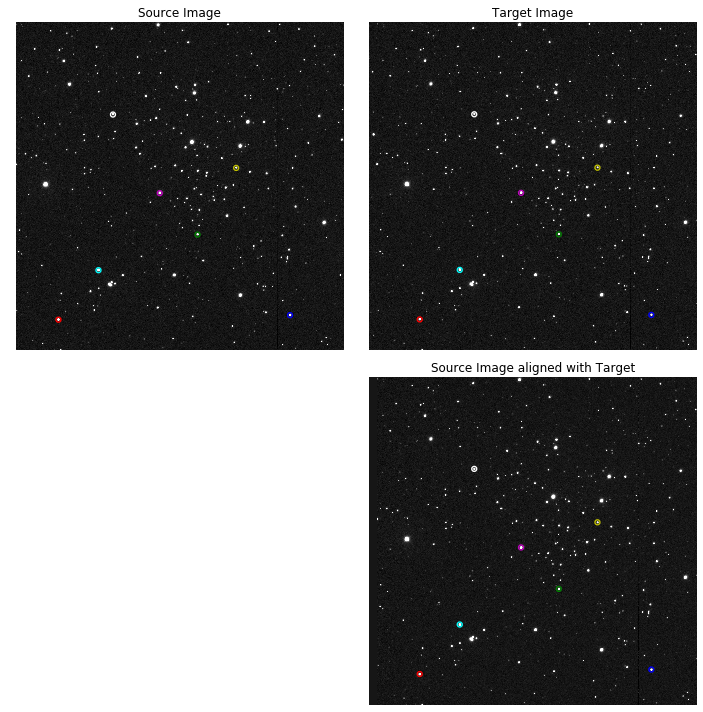

/home/c055g248/ASTR596/Data/Reduced/20191105/s088_trbf.fits
Rotation: -0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (80.27, 2.53)


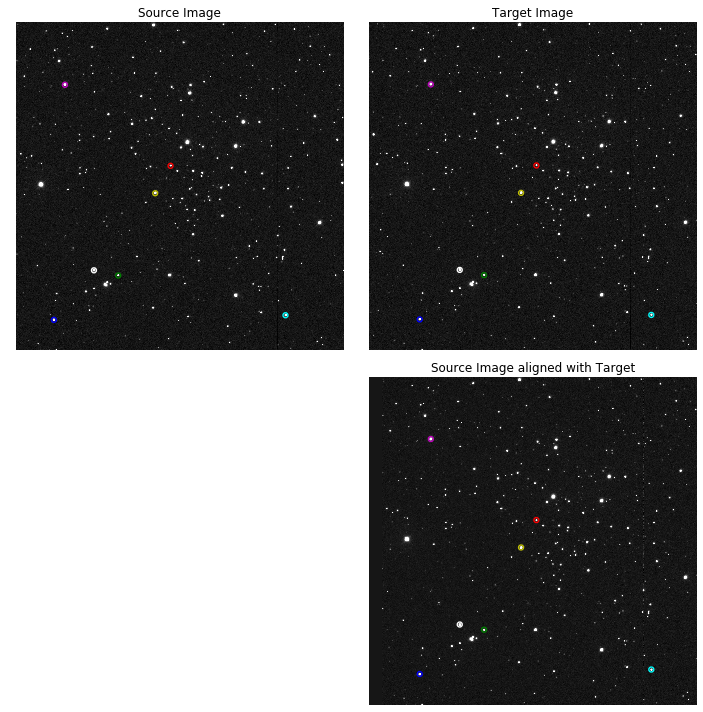

/home/c055g248/ASTR596/Data/Reduced/20191105/s089_trbf.fits
Rotation: -0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (105.66, 3.37)


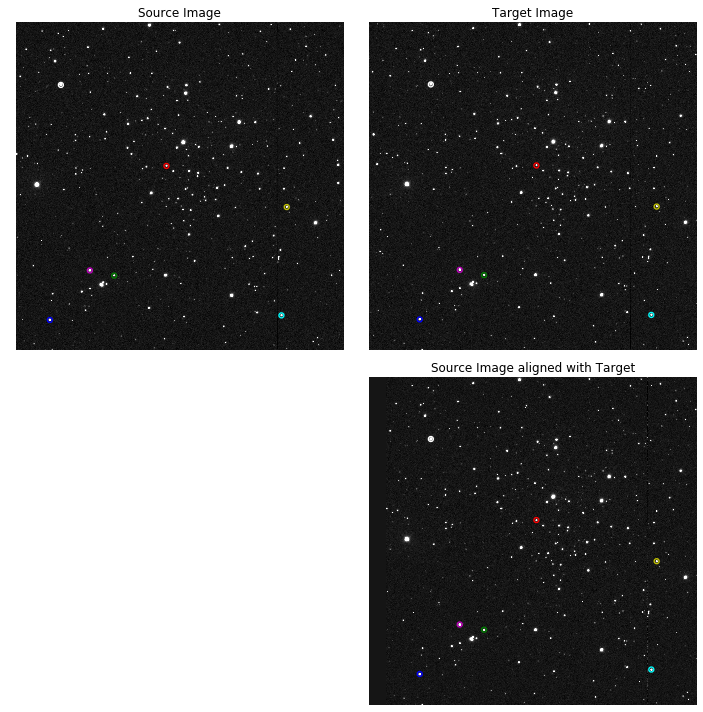

/home/c055g248/ASTR596/Data/Reduced/20191105/s090_trbf.fits
Rotation: -0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (133.80, 4.01)


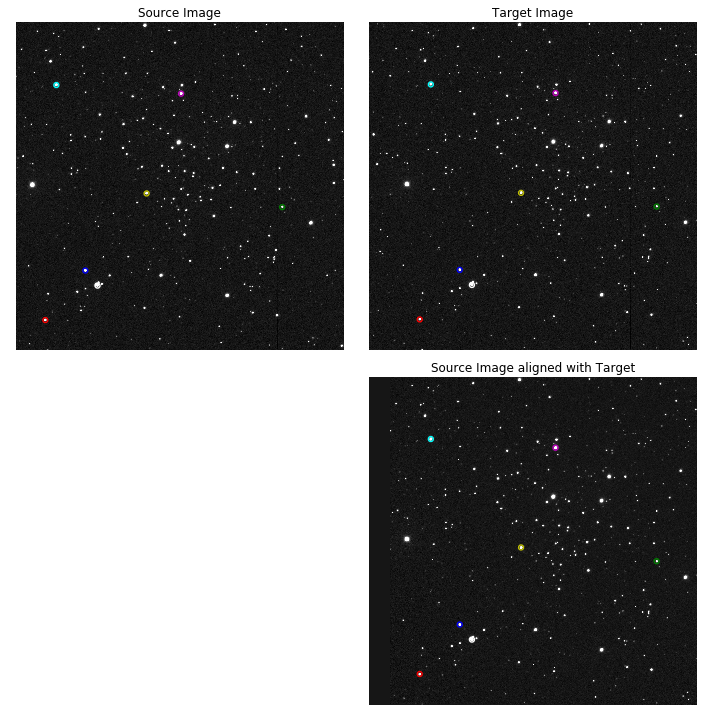

/home/c055g248/ASTR596/Data/Reduced/20191105/s091_trbf.fits
Rotation: -0.03 degrees

Scale factor: 1.00

Translation: (x, y) = (159.03, 4.73)


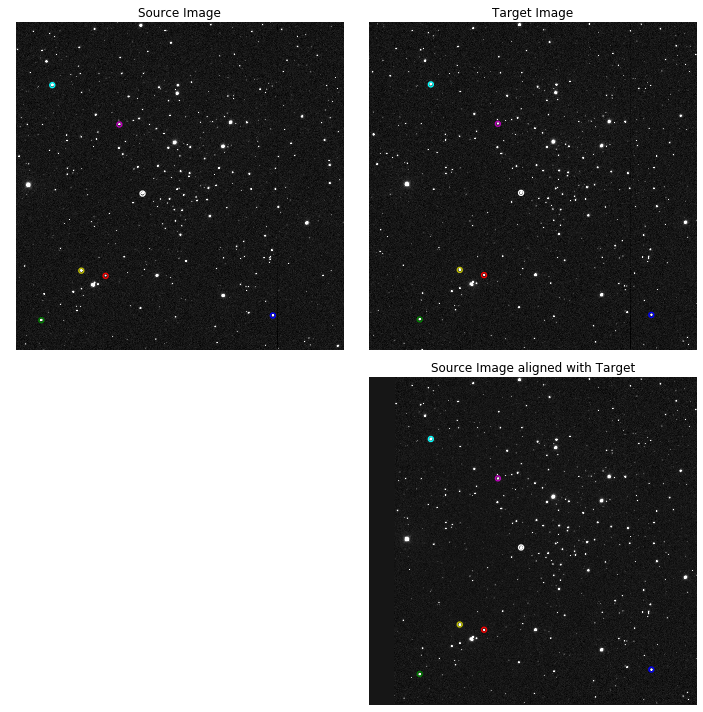

/home/c055g248/ASTR596/Data/Reduced/20191105/s092_trbf.fits
Rotation: -0.03 degrees

Scale factor: 1.00

Translation: (x, y) = (186.30, 5.74)


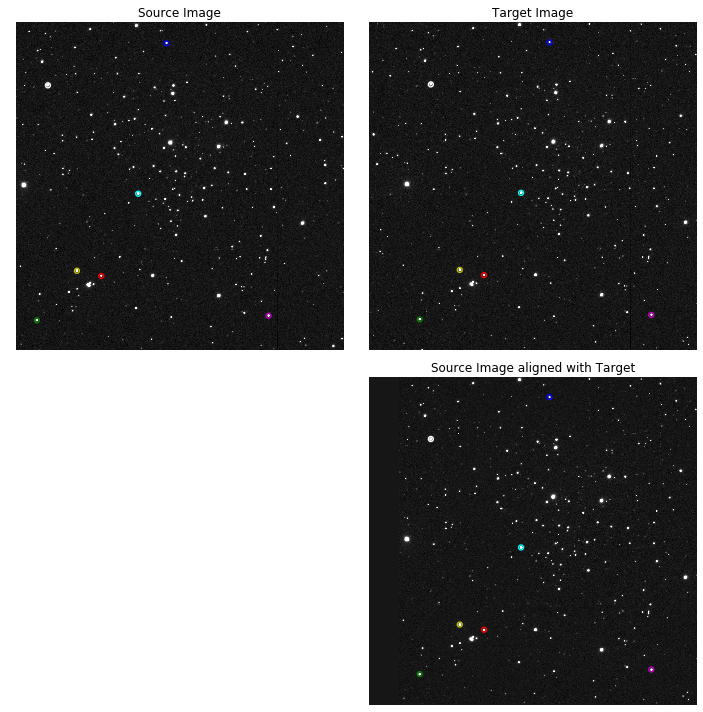

/home/c055g248/ASTR596/Data/Reduced/20191105/s101_trbf.fits
Rotation: -0.00 degrees

Scale factor: 1.00

Translation: (x, y) = (-11.11, 5.50)


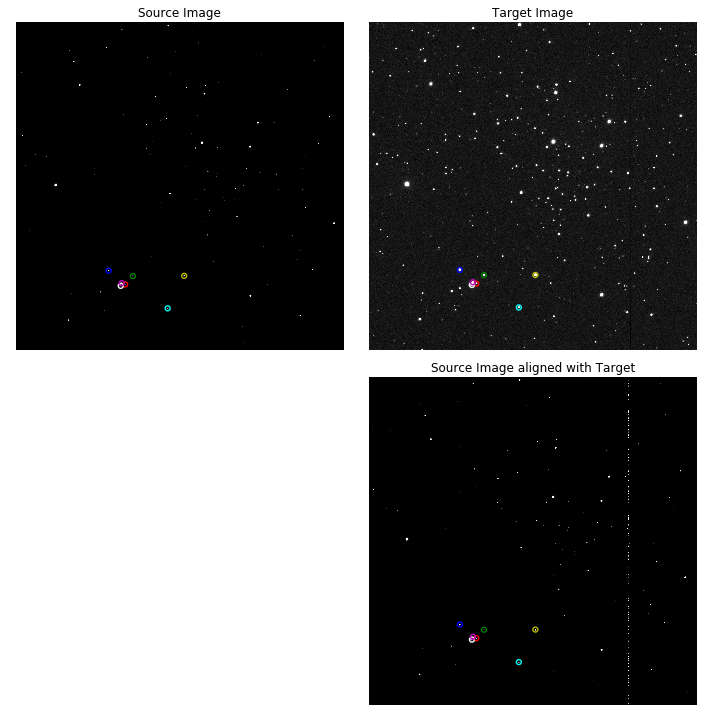

/home/c055g248/ASTR596/Data/Reduced/20191105/s102_trbf.fits
Rotation: -0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (14.75, 5.05)


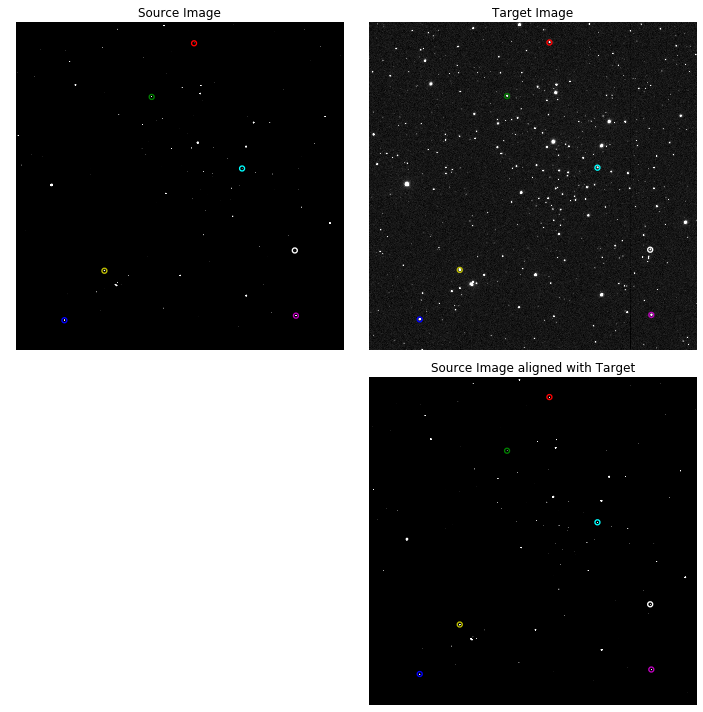

/home/c055g248/ASTR596/Data/Reduced/20191105/s103_trbf.fits
Rotation: -0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (42.92, 4.79)


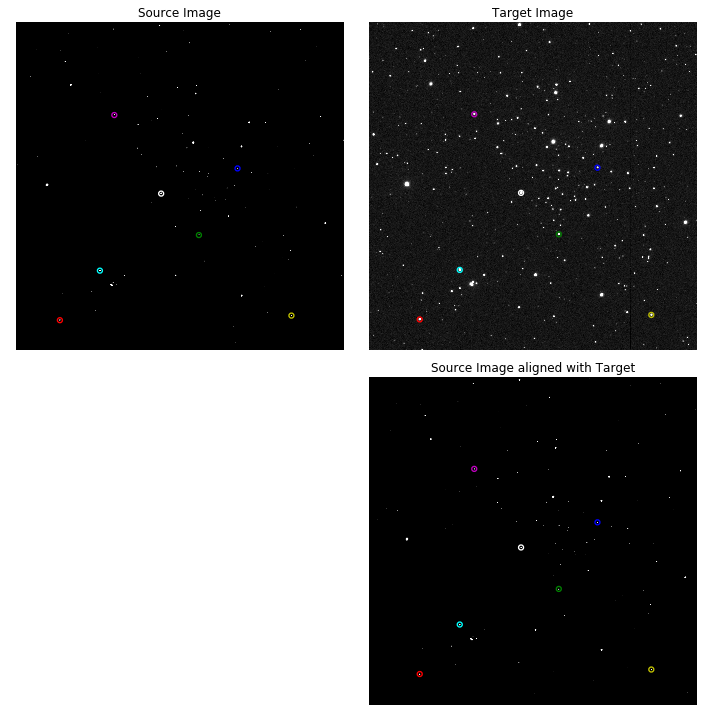

/home/c055g248/ASTR596/Data/Reduced/20191105/s094_trbf.fits
Rotation: 0.00 degrees

Scale factor: 1.00

Translation: (x, y) = (-26.94, 0.73)


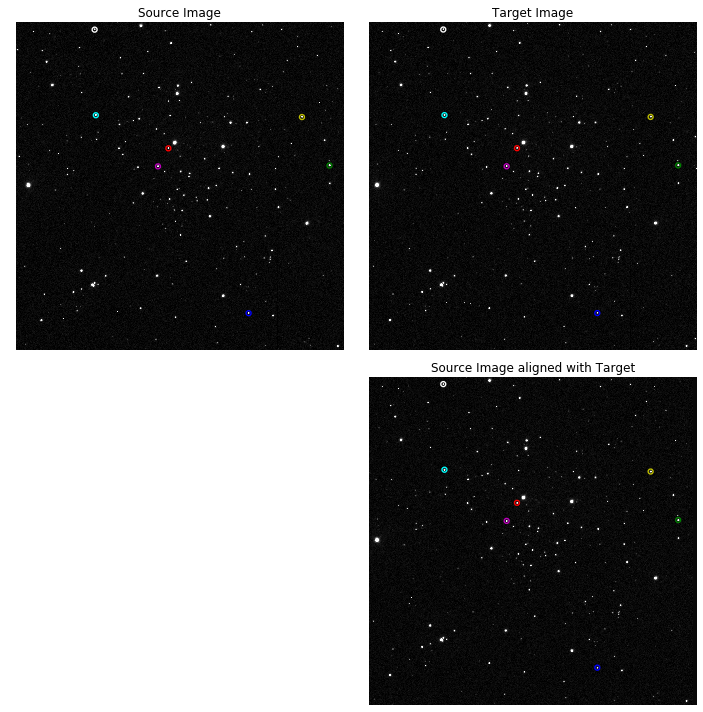

/home/c055g248/ASTR596/Data/Reduced/20191105/s095_trbf.fits
Rotation: 0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (-50.48, 0.87)


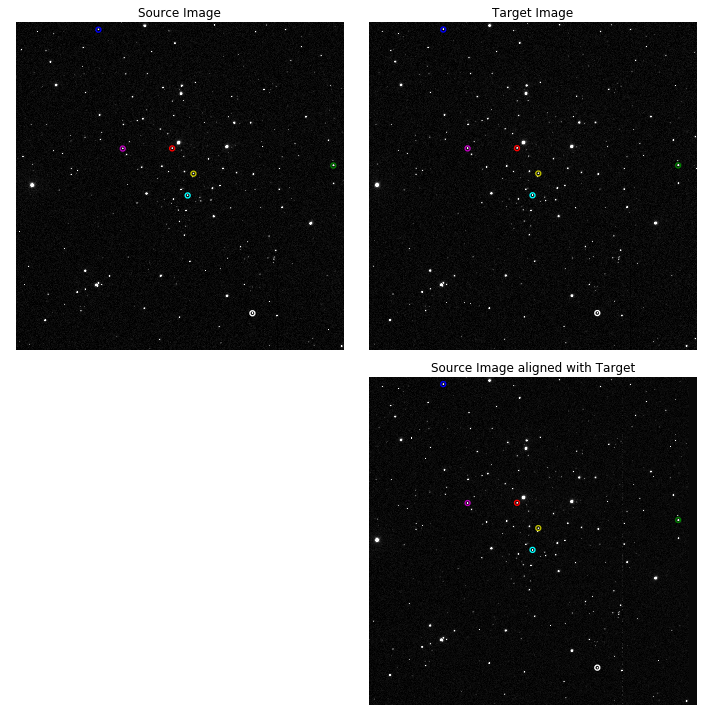

/home/c055g248/ASTR596/Data/Reduced/20191105/s096_trbf.fits
Rotation: 0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (-79.50, 0.87)


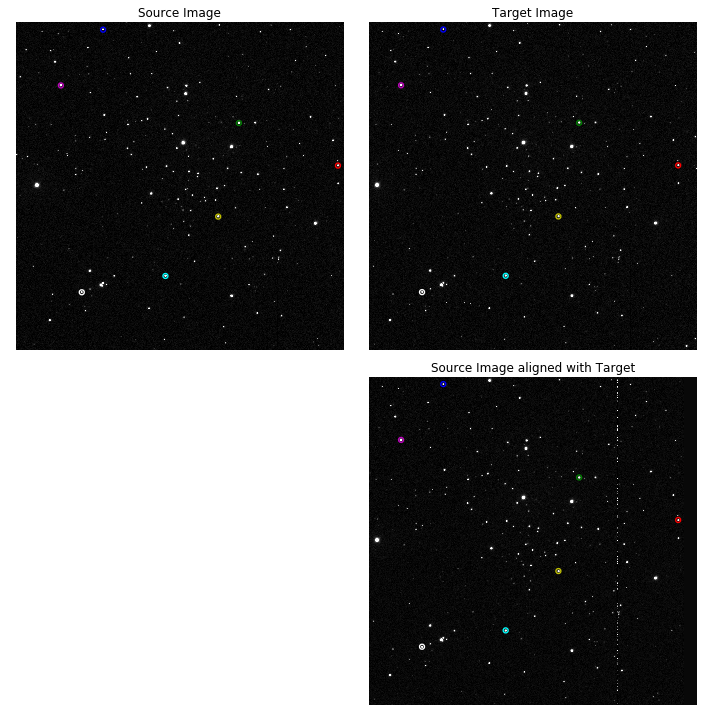

/home/c055g248/ASTR596/Data/Reduced/20191105/s097_trbf.fits
Rotation: 0.01 degrees

Scale factor: 1.00

Translation: (x, y) = (-109.32, 0.77)


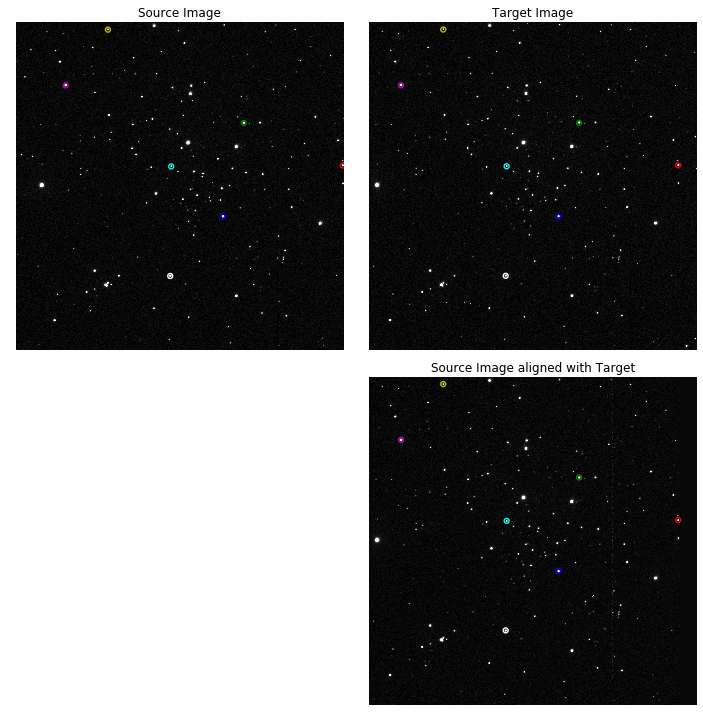

/home/c055g248/ASTR596/Data/Reduced/20191105/s098_trbf.fits
Rotation: 0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (-137.49, 0.36)


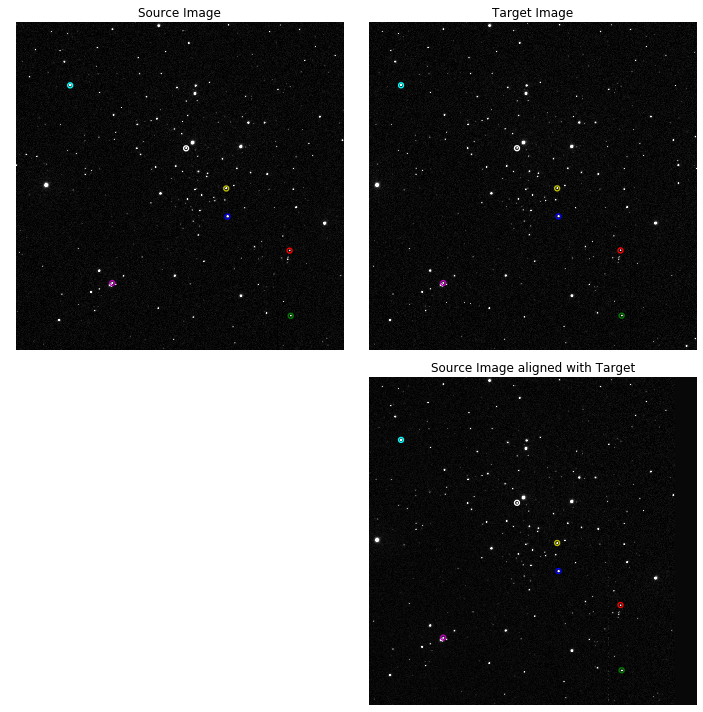

/home/c055g248/ASTR596/Data/Reduced/20191105/s099_trbf.fits
Rotation: 0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (-165.86, 0.32)


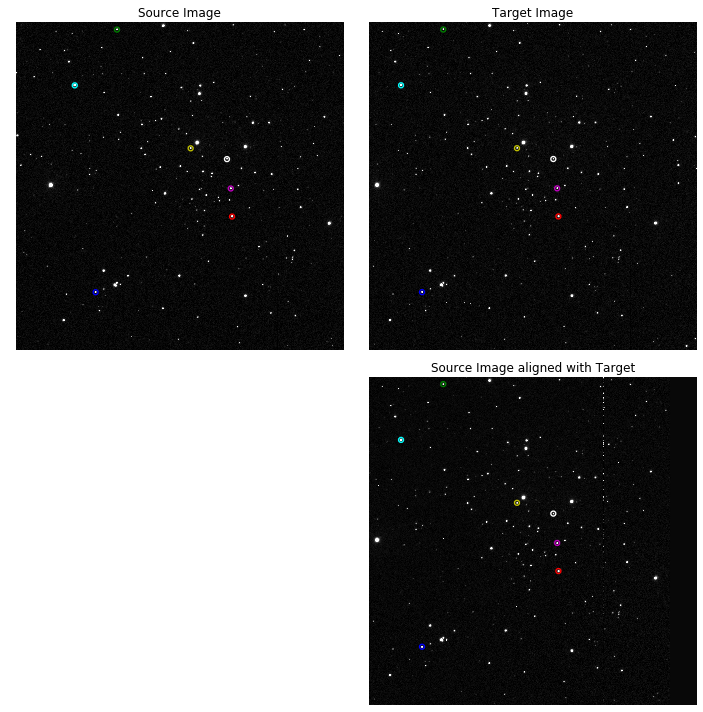

/home/c055g248/ASTR596/Data/Reduced/20191105/s100_trbf.fits
Rotation: 0.03 degrees

Scale factor: 1.00

Translation: (x, y) = (-193.97, -0.37)


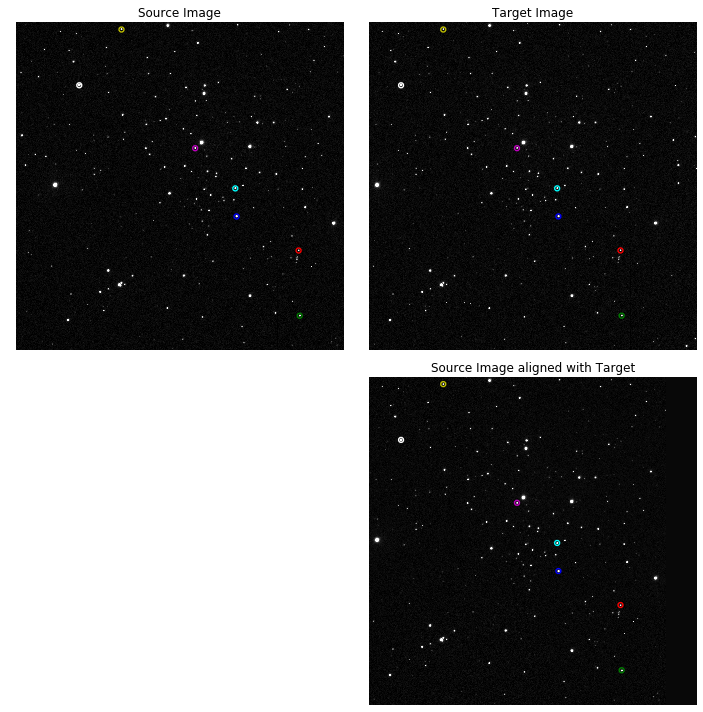

/home/c055g248/ASTR596/Data/Reduced/20191105/s104_trbf.fits
Rotation: 0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (-143.25, -1.19)


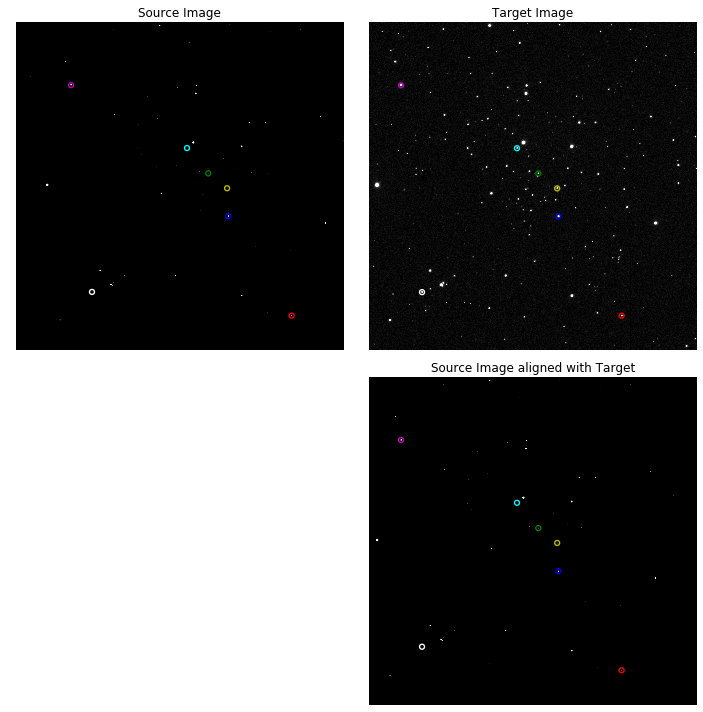

/home/c055g248/ASTR596/Data/Reduced/20191105/s105_trbf.fits
Rotation: 0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (-169.51, -0.92)


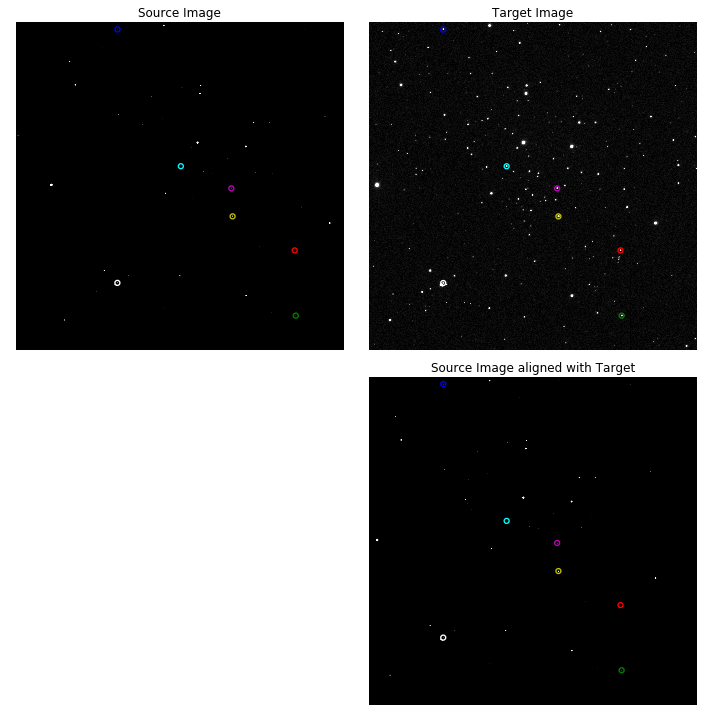

/home/c055g248/ASTR596/Data/Reduced/20191105/s106_trbf.fits
Rotation: 0.02 degrees

Scale factor: 1.00

Translation: (x, y) = (-197.11, -1.61)


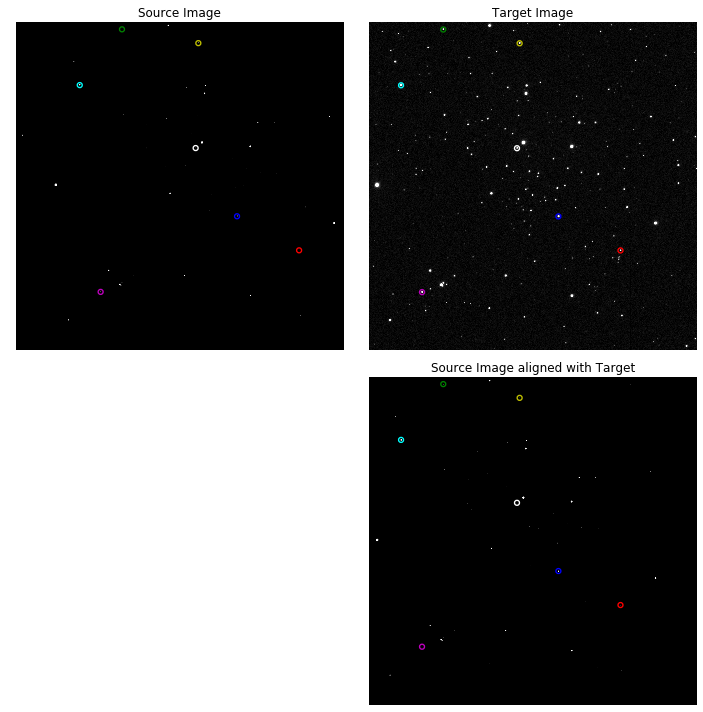

In [7]:
#***********
sciNGv = "sciNGv.txt"
sciNGb = "sciNGb.txt"

sciKINGv = "sciKINGv.txt"
sciKINGb = "sciKINGb.txt"

# V-band
im_trans("s046_trbf.fits", "s045_trbf.fits", "s046_trbfa.fits")
im_trans("s047_trbf.fits", "s045_trbf.fits", "s047_trbfa.fits")
im_trans("s048_trbf.fits", "s045_trbf.fits", "s048_trbfa.fits")
im_trans("s049_trbf.fits", "s045_trbf.fits", "s049_trbfa.fits")
im_trans("s050_trbf.fits", "s045_trbf.fits", "s050_trbfa.fits")
im_trans("s051_trbf.fits", "s045_trbf.fits", "s051_trbfa.fits")
im_trans("s052_trbf.fits", "s045_trbf.fits", "s052_trbfa.fits")
im_trans("s061_trbf.fits", "s045_trbf.fits", "s061_trbfa.fits")
im_trans("s062_trbf.fits", "s045_trbf.fits", "s062_trbfa.fits")
im_trans("s063_trbf.fits", "s045_trbf.fits", "s063_trbfa.fits")


#B Band
im_trans("s054_trbf.fits", "s053_trbf.fits", "s054_trbfa.fits")
im_trans("s055_trbf.fits", "s053_trbf.fits", "s055_trbfa.fits")
im_trans("s056_trbf.fits", "s053_trbf.fits", "s056_trbfa.fits")
im_trans("s057_trbf.fits", "s053_trbf.fits", "s057_trbfa.fits")
im_trans("s058_trbf.fits", "s053_trbf.fits", "s058_trbfa.fits")
im_trans("s059_trbf.fits", "s053_trbf.fits", "s059_trbfa.fits")
im_trans("s060_trbf.fits", "s053_trbf.fits", "s060_trbfa.fits")
im_trans("s064_trbf.fits", "s053_trbf.fits", "s064_trbfa.fits")
im_trans("s065_trbf.fits", "s053_trbf.fits", "s065_trbfa.fits")
im_trans("s066_trbf.fits", "s053_trbf.fits", "s066_trbfa.fits")

#V band KING
im_trans("s086_trbf.fits", "s085_trbf.fits", "s086_trbfa.fits")
im_trans("s087_trbf.fits", "s085_trbf.fits", "s087_trbfa.fits")
im_trans("s088_trbf.fits", "s085_trbf.fits", "s088_trbfa.fits")
im_trans("s089_trbf.fits", "s085_trbf.fits", "s089_trbfa.fits")
im_trans("s090_trbf.fits", "s085_trbf.fits", "s090_trbfa.fits")
im_trans("s091_trbf.fits", "s085_trbf.fits", "s091_trbfa.fits")
im_trans("s092_trbf.fits", "s085_trbf.fits", "s092_trbfa.fits")
im_trans("s101_trbf.fits", "s085_trbf.fits", "s101_trbfa.fits")
im_trans("s102_trbf.fits", "s085_trbf.fits", "s102_trbfa.fits")
im_trans("s103_trbf.fits", "s085_trbf.fits", "s103_trbfa.fits")

im_trans("s094_trbf.fits", "s093_trbf.fits", "s094_trbfa.fits")
im_trans("s095_trbf.fits", "s093_trbf.fits", "s095_trbfa.fits")
im_trans("s096_trbf.fits", "s093_trbf.fits", "s096_trbfa.fits")
im_trans("s097_trbf.fits", "s093_trbf.fits", "s097_trbfa.fits")
im_trans("s098_trbf.fits", "s093_trbf.fits", "s098_trbfa.fits")
im_trans("s099_trbf.fits", "s093_trbf.fits", "s099_trbfa.fits")
im_trans("s100_trbf.fits", "s093_trbf.fits", "s100_trbfa.fits")
im_trans("s104_trbf.fits", "s093_trbf.fits", "s104_trbfa.fits")
im_trans("s105_trbf.fits", "s093_trbf.fits", "s105_trbfa.fits")
im_trans("s106_trbf.fits", "s093_trbf.fits", "s106_trbfa.fits")


Now open the transformed images in ds9 in different and confirm that they are aligned by blinking the frames.